In [2]:
import pickle as pk
import tensorflow as tf
import numpy as np
from matplotlib import pyplot as plt
#from pixell import enmap
from tensorflow.keras import datasets, layers, models
from astropy.nddata import block_reduce
from astropy.convolution import Gaussian2DKernel, convolve
#from sklearn.metrics import confusion_matrix
from tensorflow.keras import regularizers
import h5py
from astropy.io import fits
import os
from utils import normalize_map, make_model

%matplotlib inline

# With y

In [3]:
#Load clusters. Right now we're just using the ACT selected clusters, although the maps include 5 optical images + 1 SZ image
"""
act = pk.load(open('/gpfs/fs0/project/r/rbond/jorlo/datasets/cluster-test/large-act/large-act_w_y.pk', 'rb'))
#redmapper = pk.load(open('/gpfs/fs0/project/r/rbond/jorlo/datasets/cluster-test/redmapper/redmapper_w_y.pk', 'rb'))
redmapper = None

#The negatives are images taken at random points in the sky with no known clusters in the image
neg_im = pk.load(open('/gpfs/fs0/project/r/rbond/jorlo/datasets/cluster-test/large-randoms/large-randoms_w_y.pk', 'rb'))
print(act.shape, neg_im.shape)
"""
h5f_random = h5py.File('/gpfs/fs0/project/r/rbond/jorlo/datasets/ml-clusters/random/random_1000_w_y.h5','r')
h5f_act = h5py.File('/gpfs/fs0/project/r/rbond/jorlo/datasets/ml-clusters/act/act_1000_w_y.h5','r')
redmapper = None

#pos_im = h5f_des['des'][:]
neg_im = h5f_random['random'][:]
act = h5f_act['act'][:]
#act = pk.load(open('/gpfs/fs0/project/r/rbond/jorlo/datasets/cluster-test/large-act/large-act_w_y.pk', 'rb'))
#neg_im = pk.load(open('/gpfs/fs0/project/r/rbond/jorlo/datasets/cluster-test/large-randoms/large-randoms_w_y.pk', 'rb'))


flags = []
for i in range(act.shape[0]):
    if np.any(np.isnan(act[i,...])):
        flags.append(i)

act = np.delete(act, flags, axis = 0)        

flags = []
for i in range(neg_im.shape[0]):
    if np.any(np.isnan(neg_im[i,...])):
        flags.append(i)

neg_im = np.delete(neg_im, flags, axis = 0)   


neg_im = neg_im[:len(act)]
act = act[:len(neg_im)]

print(len(act), len(neg_im))

if redmapper is None:
    #manually split into training + val+test
    tot = min(act.shape[0], neg_im.shape[0])
    train_size = int(0.7 * tot)
    val_size = int(0.15 * tot)
    test_size = int(0.15 * tot)
    
    train_pos = act[:train_size]
    val_pos = act[train_size:train_size + val_size]
    test_pos = act[train_size + val_size:]
    
    train_neg = neg_im[:train_size]
    val_neg = neg_im[train_size:train_size + val_size]
    test_neg = neg_im[train_size + val_size:]
     
    
else:
    train_act = act[:87]
    val_act = act[87:106]
    test_act = act[106:125]

    train_des = redmapper[:87]
    val_des= redmapper[87:106]
    test_des = redmapper[106:125]

    train_neg = neg_im[:174]
    val_neg = neg_im[174:212]
    test_neg = neg_im[212:250]

    train_pos = np.concatenate((train_act, train_des))
    val_pos = np.concatenate((val_act, val_des))
    test_pos = np.concatenate((test_act, test_des))

input_shape = train_pos.shape[1:]
print(input_shape)

551 551
(399, 399, 6)


In [4]:
print(val_neg.shape,val_pos.shape)

(82, 399, 399, 6) (82, 399, 399, 6)


In [5]:
#Putting the data together
train_images = np.concatenate((train_pos,train_neg))
val_images = np.concatenate((val_pos,val_neg))
test_images = np.concatenate((test_pos,test_neg))

train_labels = np.array(train_pos.shape[0]*[1] + train_neg.shape[0]*[0])
val_labels = np.array(val_pos.shape[0]*[1] + val_neg.shape[0]*[0])
test_labels = np.array(test_pos.shape[0]*[1] + test_neg.shape[0]*[0])

In [6]:
#Batching
batch_size = 10

train_dataset = tf.data.Dataset.from_tensor_slices((train_images, train_labels))
val_dataset = tf.data.Dataset.from_tensor_slices((val_images, val_labels))
test_dataset = tf.data.Dataset.from_tensor_slices((test_images, test_labels))


train_dataset = train_dataset.shuffle(buffer_size=1024).batch(batch_size)
val_dataset = val_dataset.shuffle(buffer_size=1024).batch(batch_size)
test_dataset = test_dataset.shuffle(buffer_size=1024).batch(batch_size)

2022-07-28 11:05:21.491207: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1525] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 31016 MB memory:  -> device: 0, name: Tesla V100-SXM2-32GB, pci bus id: 0004:04:00.0, compute capability: 7.0
2022-07-28 11:05:21.541505: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1525] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 31016 MB memory:  -> device: 1, name: Tesla V100-SXM2-32GB, pci bus id: 0004:05:00.0, compute capability: 7.0
2022-07-28 11:05:21.544871: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1525] Created device /job:localhost/replica:0/task:0/device:GPU:2 with 31016 MB memory:  -> device: 2, name: Tesla V100-SXM2-32GB, pci bus id: 0035:03:00.0, compute capability: 7.0
2022-07-28 11:05:21.548119: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1525] Created device /job:localhost/replica:0/task:0/device:GPU:3 with 31016 MB memory:  -> device: 3, name: Tesla V100-SXM2-32GB, pci bus id

In [7]:
print(train_images.shape)

(770, 399, 399, 6)


In [8]:
#Make the model
model = make_model('kosiba', input_shape = input_shape)

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 397, 397, 64)      3520      
                                                                 
 max_pooling2d (MaxPooling2D  (None, 198, 198, 64)     0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 196, 196, 32)      18464     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 98, 98, 32)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 96, 96, 32)        9248      
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 48, 48, 32)       0

In [9]:
#Train it
history = model.fit(train_dataset, epochs=10, 
                    validation_data=val_dataset)

Epoch 1/10


2022-07-28 11:06:29.532423: I tensorflow/stream_executor/cuda/cuda_dnn.cc:368] Loaded cuDNN version 8101
2022-07-28 11:06:49.419583: I tensorflow/core/platform/default/subprocess.cc:304] Start cannot spawn child process: No such file or directory
2022-07-28 11:06:49.420283: I tensorflow/core/platform/default/subprocess.cc:304] Start cannot spawn child process: No such file or directory
2022-07-28 11:06:49.420312: W tensorflow/stream_executor/gpu/asm_compiler.cc:80] Couldn't get ptxas version string: INTERNAL: Couldn't invoke ptxas --version
2022-07-28 11:06:49.420980: I tensorflow/core/platform/default/subprocess.cc:304] Start cannot spawn child process: No such file or directory
2022-07-28 11:06:49.421049: W tensorflow/stream_executor/gpu/redzone_allocator.cc:314] INTERNAL: Failed to launch ptxas
Relying on driver to perform ptx compilation. 
Modify $PATH to customize ptxas location.
This message will be only logged once.
2022-07-28 11:06:52.031244: E tensorflow/stream_executor/cuda/c

InternalError: Graph execution error:

Detected at node 'sequential/dense/MatMul' defined at (most recent call last):
    File "/home/r/rbond/jorlo/.conda/envs/ml-clusters/lib/python3.8/runpy.py", line 194, in _run_module_as_main
      return _run_code(code, main_globals, None,
    File "/home/r/rbond/jorlo/.conda/envs/ml-clusters/lib/python3.8/runpy.py", line 87, in _run_code
      exec(code, run_globals)
    File "/home/r/rbond/jorlo/.conda/envs/ml-clusters/lib/python3.8/site-packages/ipykernel_launcher.py", line 16, in <module>
      app.launch_new_instance()
    File "/home/r/rbond/jorlo/.conda/envs/ml-clusters/lib/python3.8/site-packages/traitlets/config/application.py", line 846, in launch_instance
      app.start()
    File "/home/r/rbond/jorlo/.conda/envs/ml-clusters/lib/python3.8/site-packages/ipykernel/kernelapp.py", line 677, in start
      self.io_loop.start()
    File "/home/r/rbond/jorlo/.conda/envs/ml-clusters/lib/python3.8/site-packages/tornado/platform/asyncio.py", line 199, in start
      self.asyncio_loop.run_forever()
    File "/home/r/rbond/jorlo/.conda/envs/ml-clusters/lib/python3.8/asyncio/base_events.py", line 570, in run_forever
      self._run_once()
    File "/home/r/rbond/jorlo/.conda/envs/ml-clusters/lib/python3.8/asyncio/base_events.py", line 1859, in _run_once
      handle._run()
    File "/home/r/rbond/jorlo/.conda/envs/ml-clusters/lib/python3.8/asyncio/events.py", line 81, in _run
      self._context.run(self._callback, *self._args)
    File "/home/r/rbond/jorlo/.conda/envs/ml-clusters/lib/python3.8/site-packages/ipykernel/kernelbase.py", line 471, in dispatch_queue
      await self.process_one()
    File "/home/r/rbond/jorlo/.conda/envs/ml-clusters/lib/python3.8/site-packages/ipykernel/kernelbase.py", line 460, in process_one
      await dispatch(*args)
    File "/home/r/rbond/jorlo/.conda/envs/ml-clusters/lib/python3.8/site-packages/ipykernel/kernelbase.py", line 367, in dispatch_shell
      await result
    File "/home/r/rbond/jorlo/.conda/envs/ml-clusters/lib/python3.8/site-packages/ipykernel/kernelbase.py", line 662, in execute_request
      reply_content = await reply_content
    File "/home/r/rbond/jorlo/.conda/envs/ml-clusters/lib/python3.8/site-packages/ipykernel/ipkernel.py", line 360, in do_execute
      res = shell.run_cell(code, store_history=store_history, silent=silent)
    File "/home/r/rbond/jorlo/.conda/envs/ml-clusters/lib/python3.8/site-packages/ipykernel/zmqshell.py", line 532, in run_cell
      return super().run_cell(*args, **kwargs)
    File "/home/r/rbond/jorlo/.conda/envs/ml-clusters/lib/python3.8/site-packages/IPython/core/interactiveshell.py", line 2880, in run_cell
      result = self._run_cell(
    File "/home/r/rbond/jorlo/.conda/envs/ml-clusters/lib/python3.8/site-packages/IPython/core/interactiveshell.py", line 2935, in _run_cell
      return runner(coro)
    File "/home/r/rbond/jorlo/.conda/envs/ml-clusters/lib/python3.8/site-packages/IPython/core/async_helpers.py", line 129, in _pseudo_sync_runner
      coro.send(None)
    File "/home/r/rbond/jorlo/.conda/envs/ml-clusters/lib/python3.8/site-packages/IPython/core/interactiveshell.py", line 3134, in run_cell_async
      has_raised = await self.run_ast_nodes(code_ast.body, cell_name,
    File "/home/r/rbond/jorlo/.conda/envs/ml-clusters/lib/python3.8/site-packages/IPython/core/interactiveshell.py", line 3337, in run_ast_nodes
      if await self.run_code(code, result, async_=asy):
    File "/home/r/rbond/jorlo/.conda/envs/ml-clusters/lib/python3.8/site-packages/IPython/core/interactiveshell.py", line 3397, in run_code
      exec(code_obj, self.user_global_ns, self.user_ns)
    File "/tmp/ipykernel_207930/297328091.py", line 2, in <cell line: 2>
      history = model.fit(train_dataset, epochs=10,
    File "/home/r/rbond/jorlo/.conda/envs/ml-clusters/lib/python3.8/site-packages/keras/utils/traceback_utils.py", line 64, in error_handler
      return fn(*args, **kwargs)
    File "/home/r/rbond/jorlo/.conda/envs/ml-clusters/lib/python3.8/site-packages/keras/engine/training.py", line 1384, in fit
      tmp_logs = self.train_function(iterator)
    File "/home/r/rbond/jorlo/.conda/envs/ml-clusters/lib/python3.8/site-packages/keras/engine/training.py", line 1021, in train_function
      return step_function(self, iterator)
    File "/home/r/rbond/jorlo/.conda/envs/ml-clusters/lib/python3.8/site-packages/keras/engine/training.py", line 1010, in step_function
      outputs = model.distribute_strategy.run(run_step, args=(data,))
    File "/home/r/rbond/jorlo/.conda/envs/ml-clusters/lib/python3.8/site-packages/keras/engine/training.py", line 1000, in run_step
      outputs = model.train_step(data)
    File "/home/r/rbond/jorlo/.conda/envs/ml-clusters/lib/python3.8/site-packages/keras/engine/training.py", line 859, in train_step
      y_pred = self(x, training=True)
    File "/home/r/rbond/jorlo/.conda/envs/ml-clusters/lib/python3.8/site-packages/keras/utils/traceback_utils.py", line 64, in error_handler
      return fn(*args, **kwargs)
    File "/home/r/rbond/jorlo/.conda/envs/ml-clusters/lib/python3.8/site-packages/keras/engine/base_layer.py", line 1096, in __call__
      outputs = call_fn(inputs, *args, **kwargs)
    File "/home/r/rbond/jorlo/.conda/envs/ml-clusters/lib/python3.8/site-packages/keras/utils/traceback_utils.py", line 92, in error_handler
      return fn(*args, **kwargs)
    File "/home/r/rbond/jorlo/.conda/envs/ml-clusters/lib/python3.8/site-packages/keras/engine/sequential.py", line 374, in call
      return super(Sequential, self).call(inputs, training=training, mask=mask)
    File "/home/r/rbond/jorlo/.conda/envs/ml-clusters/lib/python3.8/site-packages/keras/engine/functional.py", line 451, in call
      return self._run_internal_graph(
    File "/home/r/rbond/jorlo/.conda/envs/ml-clusters/lib/python3.8/site-packages/keras/engine/functional.py", line 589, in _run_internal_graph
      outputs = node.layer(*args, **kwargs)
    File "/home/r/rbond/jorlo/.conda/envs/ml-clusters/lib/python3.8/site-packages/keras/utils/traceback_utils.py", line 64, in error_handler
      return fn(*args, **kwargs)
    File "/home/r/rbond/jorlo/.conda/envs/ml-clusters/lib/python3.8/site-packages/keras/engine/base_layer.py", line 1096, in __call__
      outputs = call_fn(inputs, *args, **kwargs)
    File "/home/r/rbond/jorlo/.conda/envs/ml-clusters/lib/python3.8/site-packages/keras/utils/traceback_utils.py", line 92, in error_handler
      return fn(*args, **kwargs)
    File "/home/r/rbond/jorlo/.conda/envs/ml-clusters/lib/python3.8/site-packages/keras/layers/core/dense.py", line 219, in call
      outputs = tf.matmul(a=inputs, b=self.kernel)
Node: 'sequential/dense/MatMul'
Attempting to perform BLAS operation using StreamExecutor without BLAS support
	 [[{{node sequential/dense/MatMul}}]] [Op:__inference_train_function_1047]

4/4 - 0s - loss: 0.0364 - accuracy: 1.0000


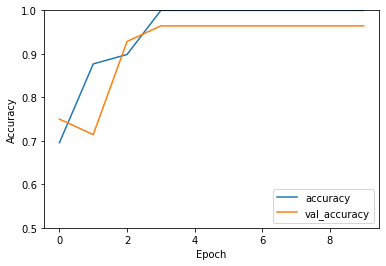

In [73]:
plt.plot(history.history['accuracy'], label='accuracy')
plt.plot(history.history['val_accuracy'], label = 'val_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.ylim([0.5, 1])
plt.legend(loc='lower right')

test_loss, test_acc = model.evaluate(test_dataset, verbose=2)

Result take away: the model does very well identifying SZ identified clusters and the negatives, but is not able to identify the optically selected clusters: in other words, the optical clusters don't look like the SZ clusters. This is obviously true when considering the SZ images only but we had hoped including the optical images for the SZ identified clusters would allow the cnn to identify optically detected clusters


In [48]:

remainder_act = act[125:]
remainder_des = redmapper[125:]
remainder_randoms = neg_im[250:]

des_labels = np.array([1]*remainder_des.shape[0])
act_labels = np.array([1]*remainder_act.shape[0])
randoms_labels = np.array([0]*remainder_randoms.shape[0])

act_loss, act_acc = model.evaluate(x = remainder_act, y = act_labels, verbose=2)
des_loss, des_acc = model.evaluate(x = remainder_des, y = des_labels, verbose=2)
randoms_loss, randoms_acc = model.evaluate(x = remainder_randoms, y = randoms_labels, verbose=2)


194/194 - 0s - loss: 0.1581 - accuracy: 0.9691
285/285 - 1s - loss: 2.1841 - accuracy: 0.4351
38/38 - 0s - loss: 0.2802 - accuracy: 0.8684


1 0 93.67502927780151


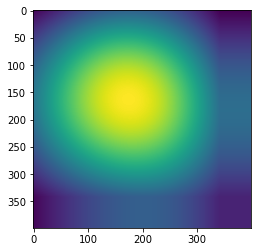

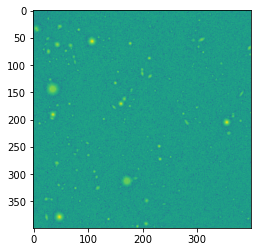

0 0 100.0


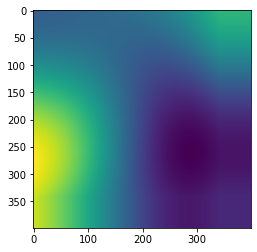

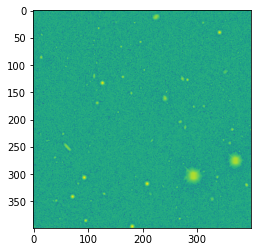

1 1 96.98230624198914


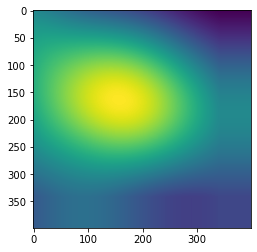

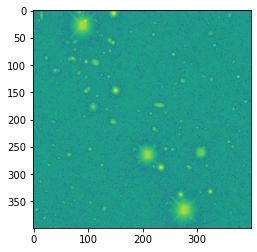

1 1 86.61288022994995


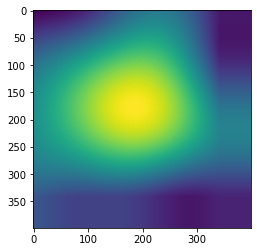

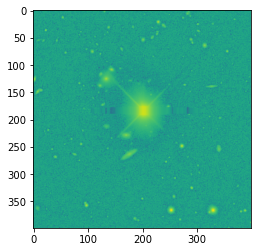

1 0 99.75869655609131


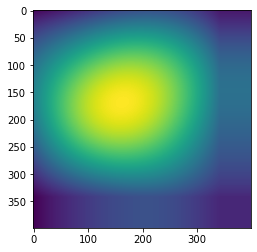

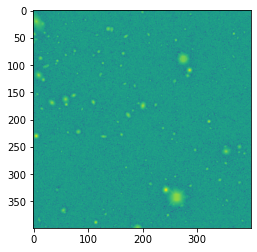

1 1 95.15041708946228


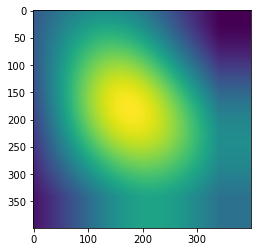

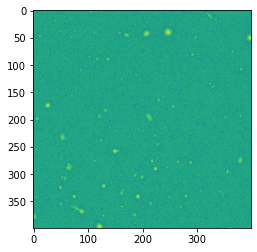

0 0 68.20404529571533


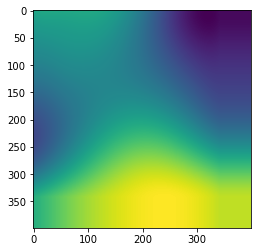

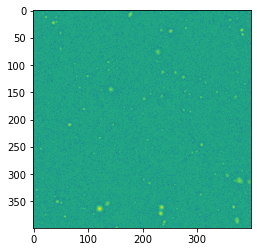

1 0 98.00573587417603


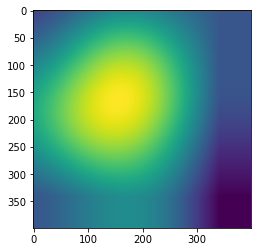

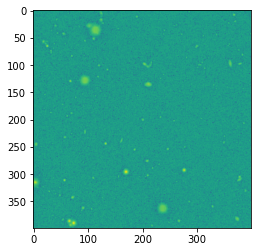

0 0 91.33726358413696


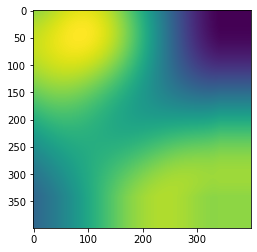

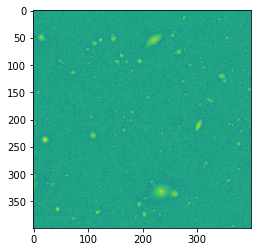

1 1 98.38215112686157


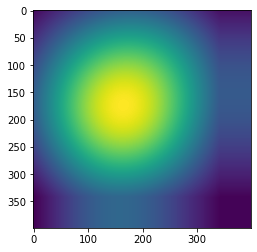

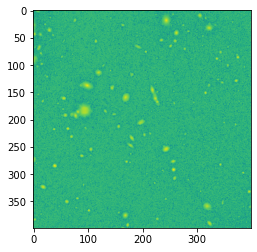

1 1 54.94647026062012


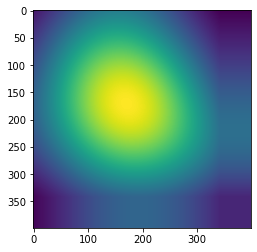

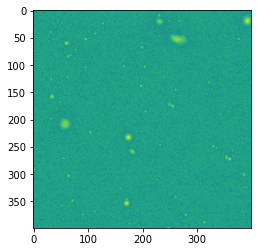

1 1 67.693692445755


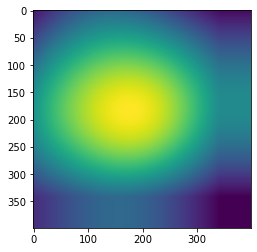

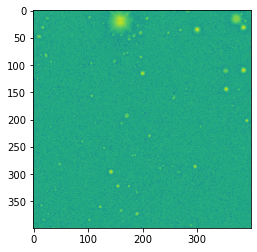

0 1 52.15402841567993


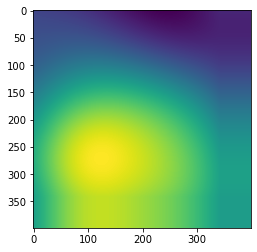

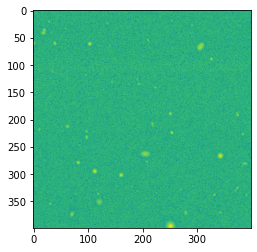

0 0 86.9497001171112


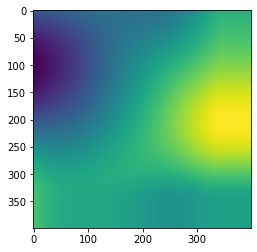

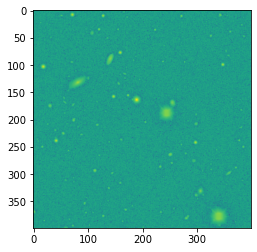

0 1 83.47449898719788


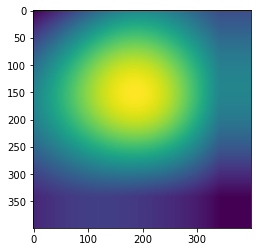

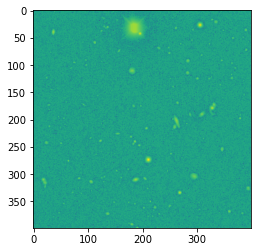

0 1 57.565778493881226


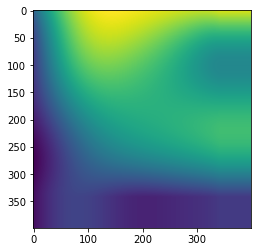

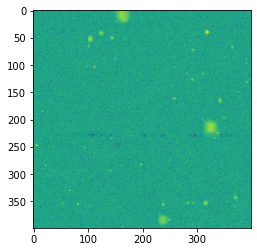

1 1 78.95338535308838


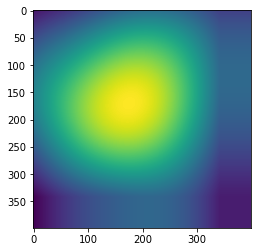

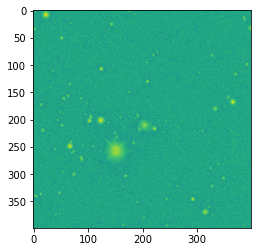

0 0 99.99995231628418


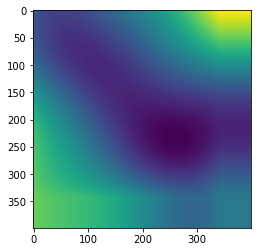

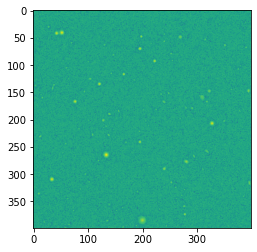

0 1 63.76853585243225


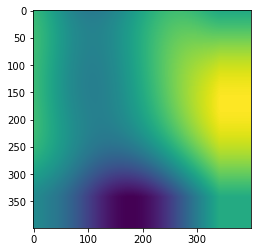

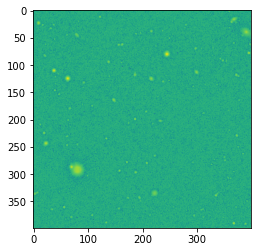

1 0 93.53534579277039


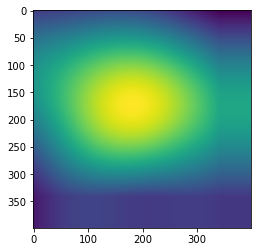

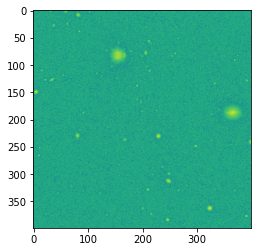

0 0 99.87016916275024


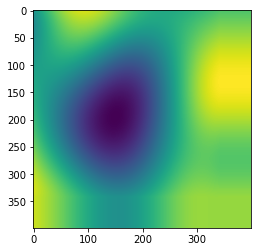

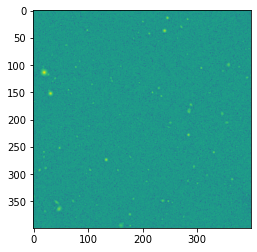

1 1 91.00189805030823


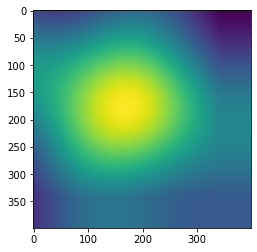

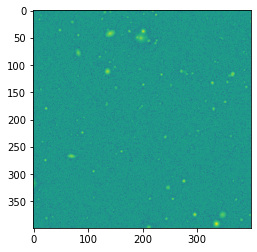

0 0 67.26107597351074


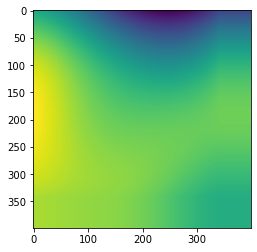

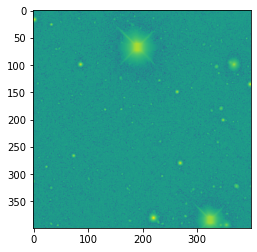

1 1 51.178330183029175


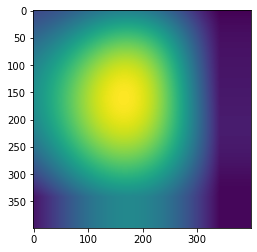

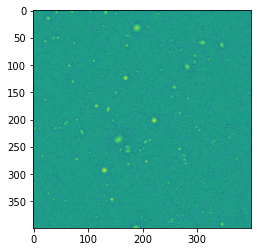

1 1 66.90713763237


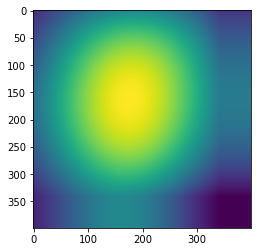

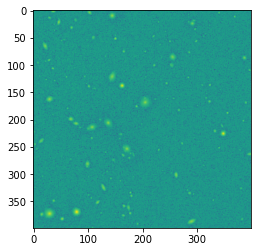

1 0 83.03418159484863


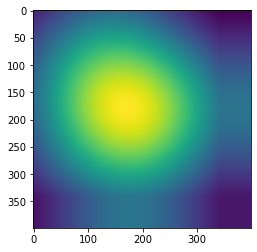

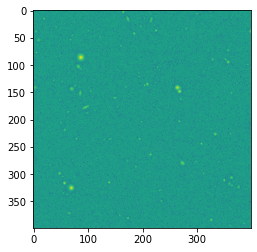

1 1 77.75440216064453


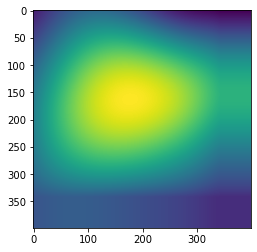

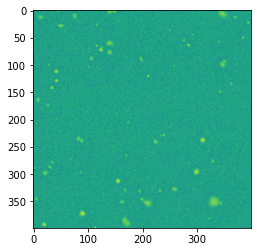

1 0 97.2727119922638


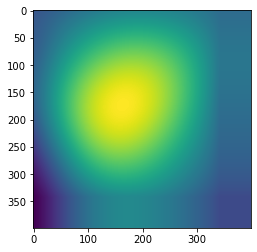

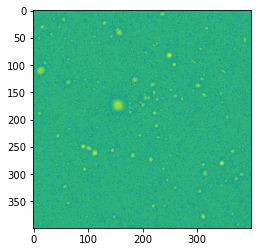

0 0 99.79423880577087


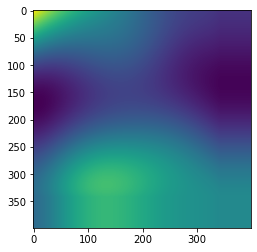

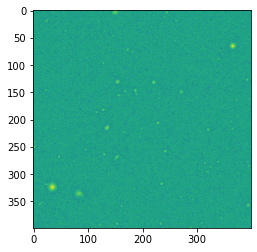

1 1 78.65619659423828


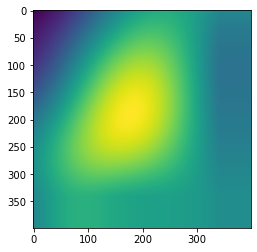

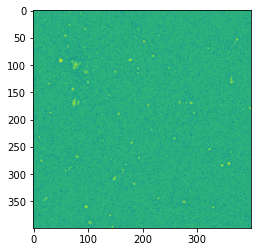

1 1 78.91683578491211


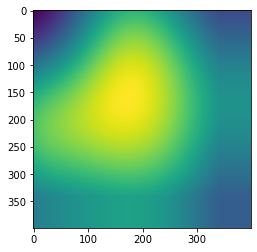

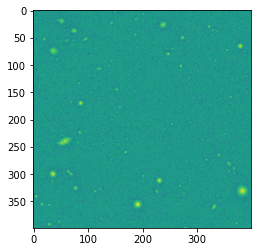

0 0 99.85803365707397


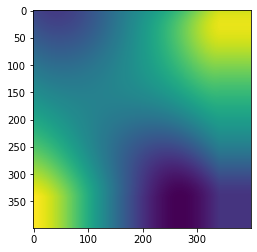

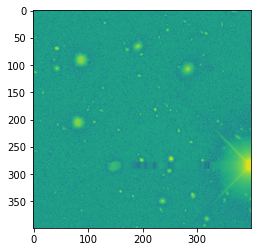

0 1 57.7436625957489


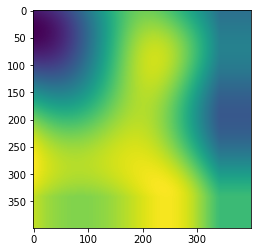

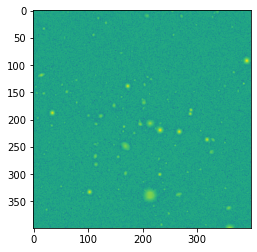

0 1 55.16693592071533


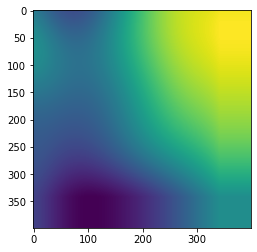

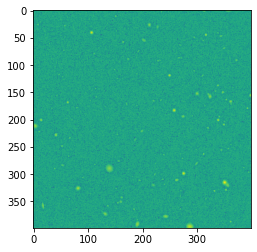

0 0 90.27882218360901


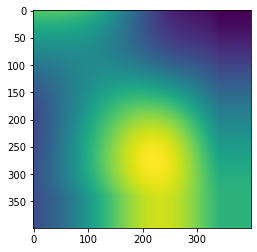

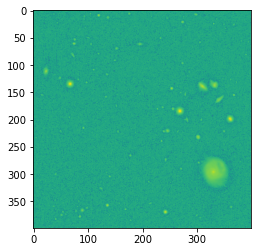

1 0 70.56341171264648


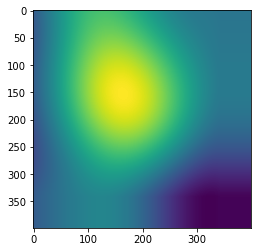

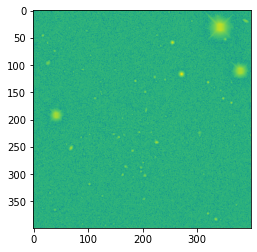

In [85]:
#Just looking to see if there are any obvious trends
for thing in test_dataset:
    for i in range(thing[1].shape[0]):
        truth = thing[1][i]
        imap = thing[0][i]
        pred = model.predict(np.expand_dims(thing[0][i], axis = 0))
        print(truth.numpy(), np.argmax(tf.nn.softmax(pred)[0]), 100*np.max(tf.nn.softmax(pred)[0]))
        plt.imshow(imap[...,5])
        plt.show()
        plt.close()
        plt.imshow(np.log(np.abs(imap[...,2])))
        plt.show()
        plt.close()

1 0 99.99998807907104


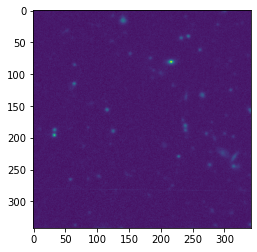

1 0 100.0


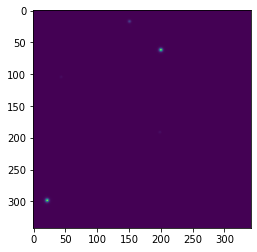

1 1 51.43756866455078


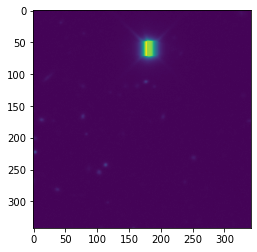

1 0 100.0


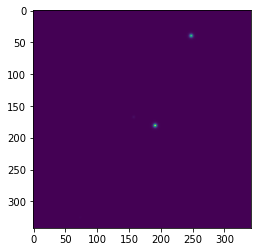

1 0 100.0


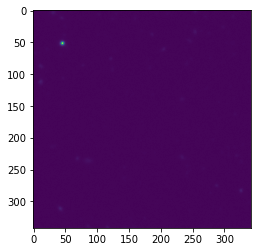

1 0 100.0


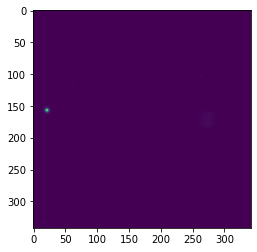

1 0 100.0


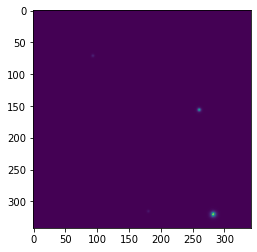

1 0 100.0


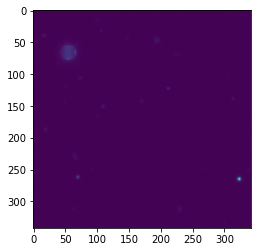

1 0 64.16348218917847


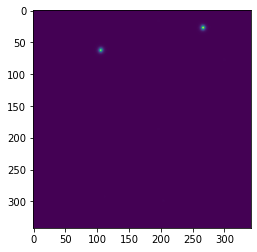

1 0 99.99686479568481


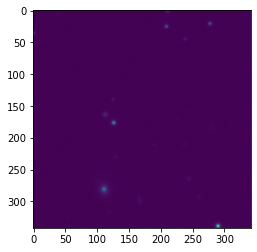

1 0 100.0


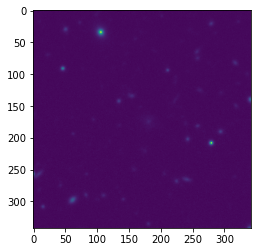

1 0 100.0


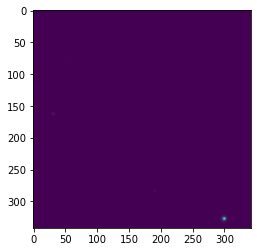

1 1 95.31106352806091


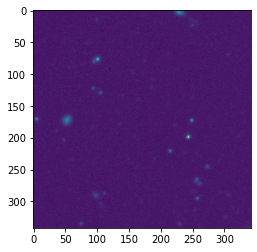

1 0 78.64860892295837


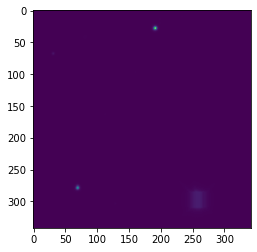

1 0 100.0


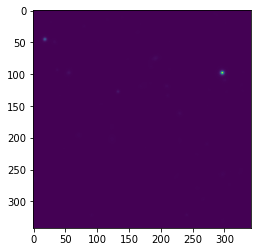

1 0 100.0


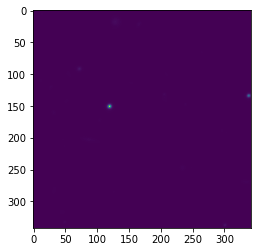

1 0 100.0


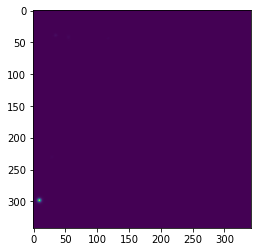

1 0 100.0


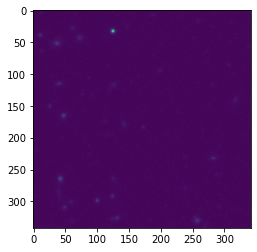

1 1 98.05677533149719


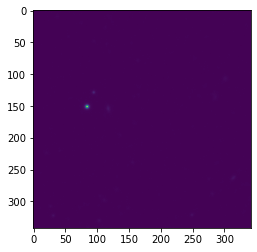

1 1 96.967613697052


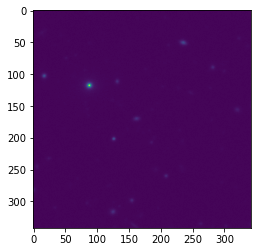

1 0 100.0


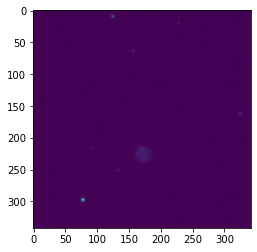

1 0 100.0


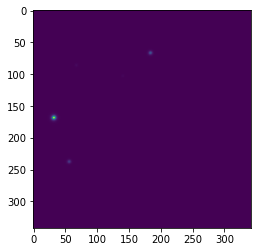

1 0 100.0


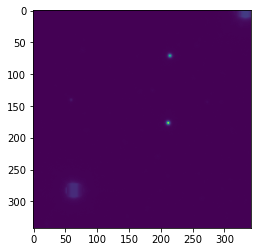

1 0 100.0


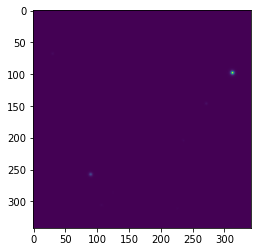

1 0 100.0


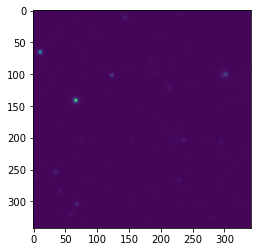

1 0 98.35042953491211


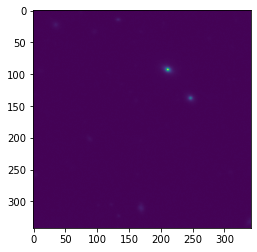

1 0 86.39724254608154


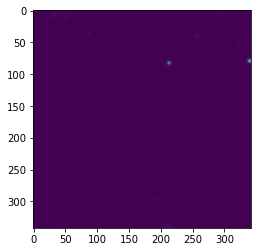

1 0 100.0


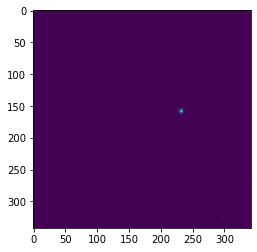

1 0 99.99998807907104


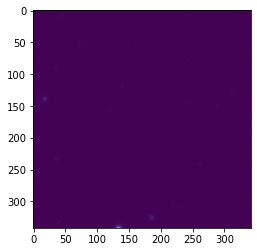

1 0 99.99998807907104


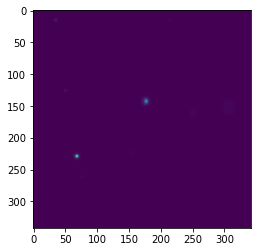

1 0 100.0


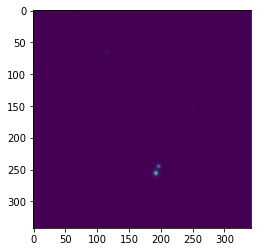

1 0 96.47384285926819


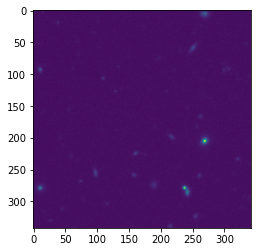

1 0 83.39550495147705


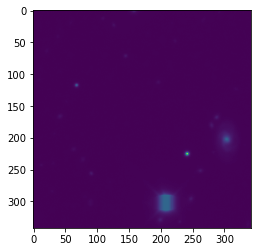

1 0 100.0


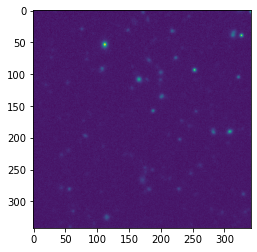

1 0 99.99897480010986


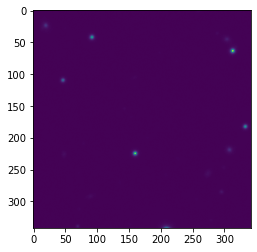

1 0 100.0


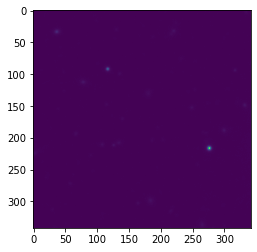

1 0 52.05683708190918


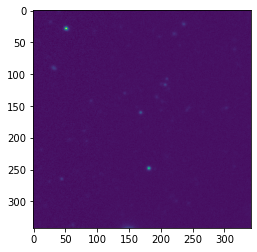

1 0 98.96408915519714


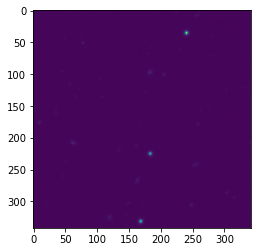

1 1 99.99985694885254


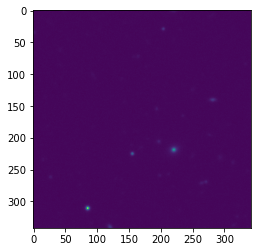

1 0 100.0


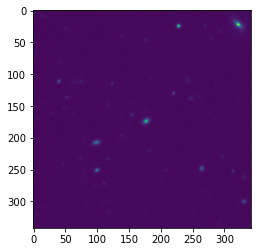

1 0 100.0


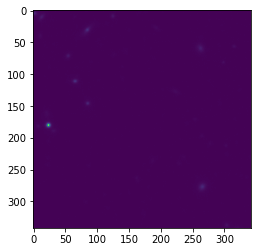

1 0 99.70290064811707


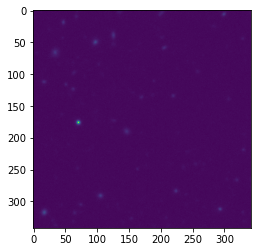

1 1 95.11218070983887


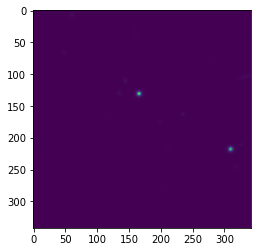

1 0 99.67082738876343


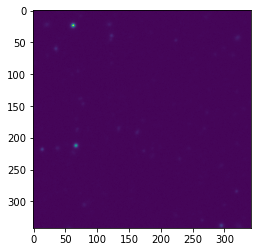

1 0 86.57522797584534


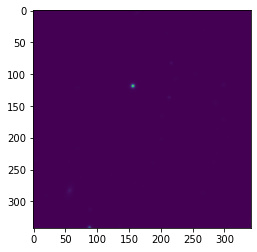

1 0 99.71680045127869


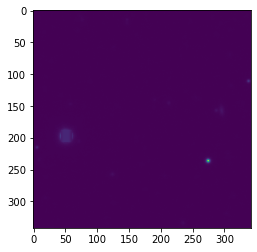

1 0 99.99845027923584


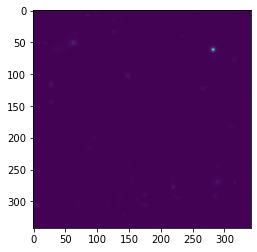

1 0 100.0


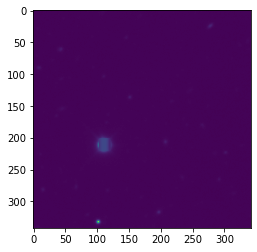

1 0 99.94445443153381


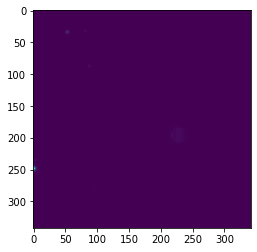

1 0 98.4714686870575


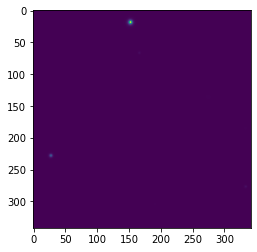

1 0 99.99873638153076


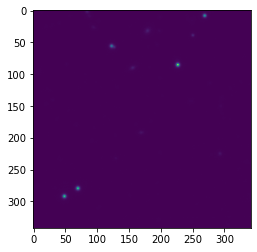

1 1 99.78725910186768


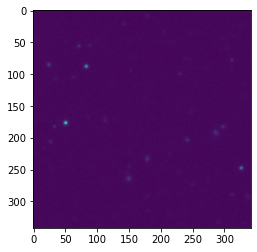

1 0 99.99991655349731


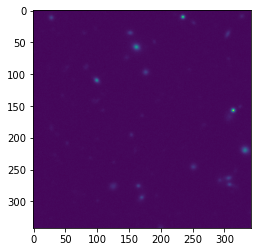

1 0 100.0


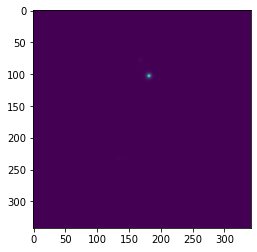

1 0 100.0


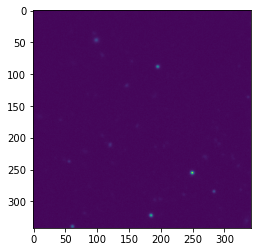

1 0 99.60144758224487


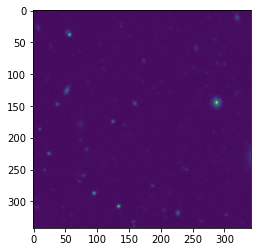

1 0 99.99992847442627


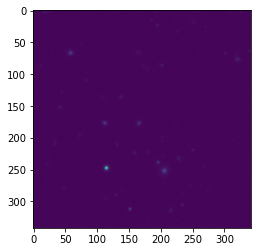

1 0 100.0


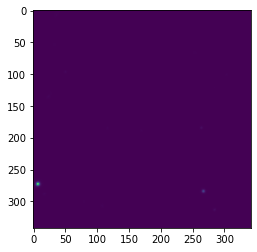

1 0 99.99908208847046


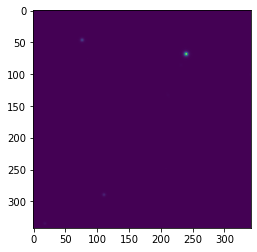

1 0 80.8050811290741


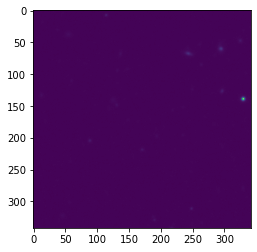

1 0 100.0


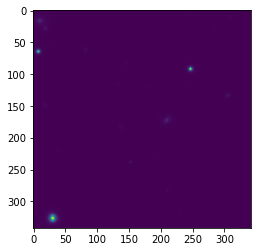

1 1 98.88655543327332


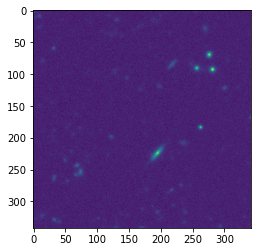

1 0 99.99997615814209


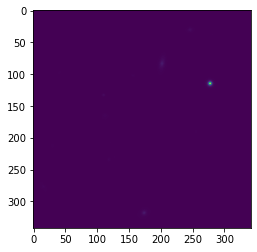

1 0 100.0


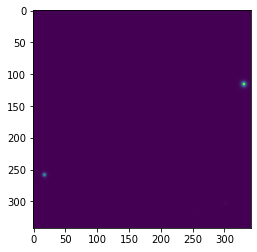

1 0 99.92913007736206


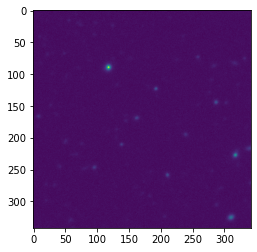

1 0 99.32674169540405


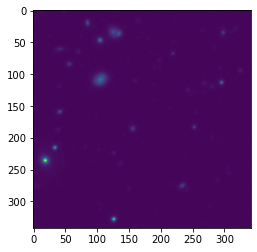

1 0 100.0


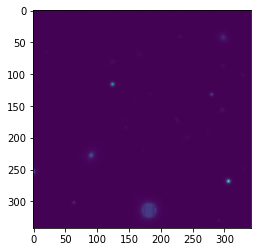

1 0 99.80545043945312


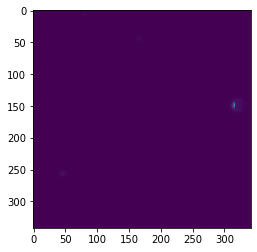

1 0 100.0


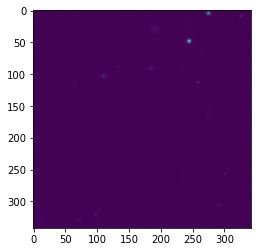

1 0 99.99998807907104


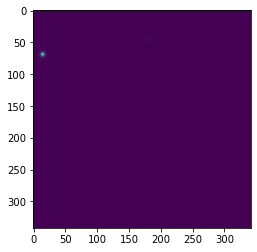

1 1 72.00316190719604


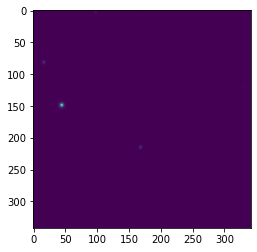

1 0 100.0


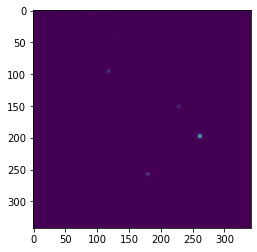

1 0 100.0


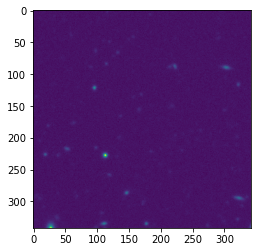

1 0 99.86159801483154


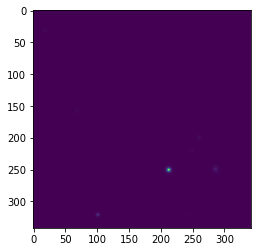

1 0 66.9795036315918


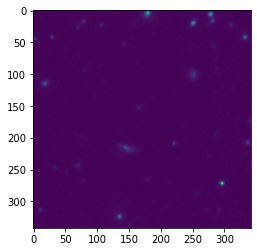

1 0 100.0


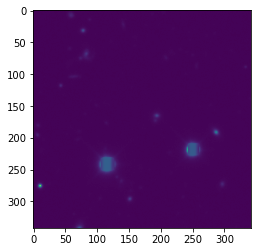

1 0 100.0


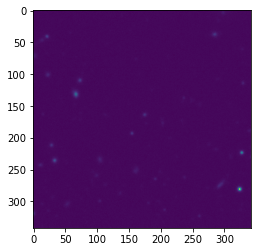

1 0 97.42761254310608


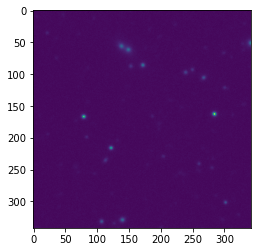

1 0 99.99579191207886


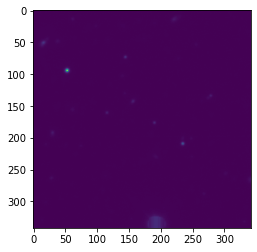

1 0 99.11995530128479


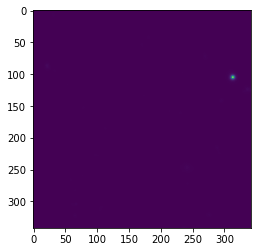

1 0 99.99964237213135


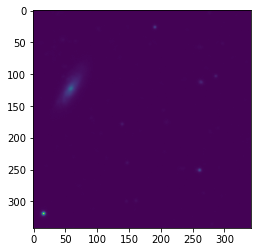

1 0 99.99924898147583


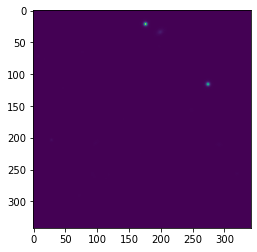

1 0 99.99933242797852


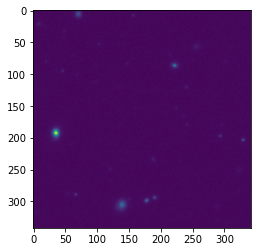

1 0 99.97076392173767


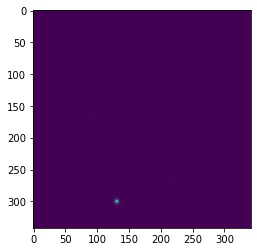

1 0 100.0


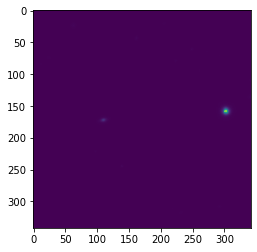

1 1 60.428351163864136


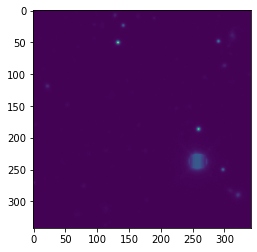

1 0 100.0


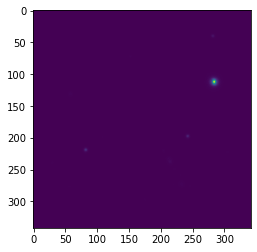

1 0 100.0


KeyboardInterrupt: 

In [246]:
for i in range(redmapper.shape[0]):
    truth = 1
    imap = redmapper[i]
    pred = model.predict(np.expand_dims(redmapper[i], axis = 0))
    print(truth, np.argmax(tf.nn.softmax(pred)[0]), 100*np.max(tf.nn.softmax(pred)[0]))
    plt.imshow(imap[...,1])
    plt.show()
    plt.close()

# Redmapper only

In [69]:
#Trying to learn what optically selected clusters look like in the sz and optical, no SZ clusters included 

h5f_des = h5py.File('/gpfs/fs0/project/r/rbond/jorlo/datasets/ml-clusters/des/full_des_1000_w_y.h5','r')
h5f_random = h5py.File('/gpfs/fs0/project/r/rbond/jorlo/datasets/ml-clusters/random/full_random_1000_w_y.h5','r')
h5f_act = h5py.File('/gpfs/fs0/project/r/rbond/jorlo/datasets/ml-clusters/act/full_act_1000_w_y.h5','r')


pos_im_1 = h5f_des['des'][:]
neg_im = h5f_random['random'][:]
pos_im_2 = h5f_act['act'][:]

pos_im = np.concatenate((pos_im_1, pos_im_2))

flags = []
for i in range(pos_im.shape[0]):
    if np.any(np.isnan(pos_im[i,...])):
        flags.append(i)

pos_im = np.delete(pos_im, flags, axis = 0)        

flags = []
for i in range(neg_im.shape[0]):
    if np.any(np.isnan(neg_im[i,...])):
        flags.append(i)

neg_im = np.delete(neg_im, flags, axis = 0)   


neg_im = neg_im[:len(pos_im)]
pos_im = pos_im[:len(neg_im)]

print(len(pos_im), len(neg_im))


#pos_im, neg_im = pos_im[...,:5], neg_im[...,:5]

922 922


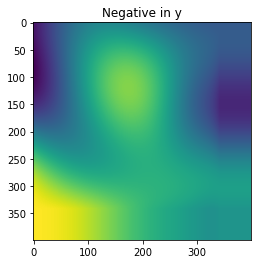

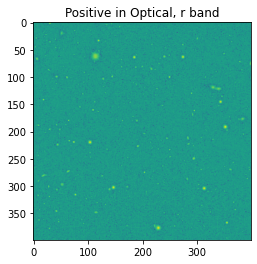

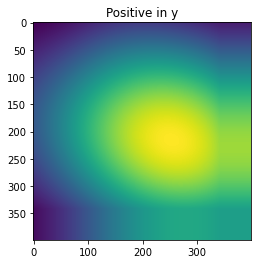

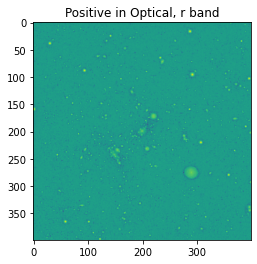

In [79]:
i = 2

plt.imshow(neg_im[i,...,5])
plt.title('Negative in y')
plt.show()
plt.close()


plt.imshow(np.log(np.abs(neg_im[i,...,1])))
plt.title('Positive in Optical, r band')
plt.show()
plt.close()

j = 2
plt.imshow(pos_im[j,...,5])
plt.title('Positive in y')
plt.show()
plt.close()


plt.imshow(np.log(np.abs(pos_im[j,...,1])))
plt.title('Positive in Optical, r band')
plt.show()
plt.close()


In [135]:
#pos_im, neg_im = pos_im[...,3:], neg_im[...,3:]
np.std(pos_im[0,...,0])

1.0000000000000002

In [136]:
tot = min(pos_im.shape[0], neg_im.shape[0])
train_size = int(0.7 * tot)
val_size = int(0.15 * tot)
test_size = int(0.15 * tot)
    
train_pos = pos_im[:train_size]
val_pos = pos_im[train_size:train_size + val_size]
test_pos = pos_im[train_size + val_size:]
    
train_neg = neg_im[:train_size]
val_neg = neg_im[train_size:train_size + val_size]
test_neg = neg_im[train_size + val_size:]

input_shape = train_pos.shape[1:]



In [137]:
print(train_pos.shape, train_neg.shape)
print(input_shape)

(645, 399, 399, 6) (645, 399, 399, 6)
(399, 399, 6)


In [138]:
train_images = np.concatenate((train_pos,train_neg))
val_images = np.concatenate((val_pos,val_neg))
test_images = np.concatenate((test_pos,test_neg))

train_labels = np.array(train_pos.shape[0]*[1] + train_neg.shape[0]*[0])
val_labels = np.array(val_pos.shape[0]*[1] + val_neg.shape[0]*[0])
test_labels = np.array(test_pos.shape[0]*[1] + test_neg.shape[0]*[0])

In [139]:
batch_size = 10

#data_augmentation = tf.keras.Sequential(
#    [
#        tf.keras.preprocessing.image.RandomFlip("horizontal"),
#        tf.keras.preprocessing.RandomRotation(0.1),
#        tf.keras.preprocessing.RandomZoom(0.1),
#        tf.keras.preprocessing.image.random_shift(0.01, 0.01),
#    ]
#)

data_augmentation = tf.keras.preprocessing.image.ImageDataGenerator(rotation_range=360, width_shift_range=4,
    height_shift_range=4,zoom_range=0.3)

def prepare(ds, shuffle=False, augment=False):

  if shuffle:
    ds = ds.shuffle(1000)

  # Batch all datasets
  ds = ds.batch(batch_size)

  # Use data augmentation only on the training set
  if augment:
    ds = ds.map(lambda x, y: (data_augmentation(x, training=True), y), )

  # Use buffered prefecting on all datasets
  return ds

In [140]:
batch_size = 10

train_dataset = tf.data.Dataset.from_tensor_slices((train_images, train_labels))
val_dataset = tf.data.Dataset.from_tensor_slices((val_images, val_labels))
test_dataset = tf.data.Dataset.from_tensor_slices((test_images, test_labels))

train_dataset = train_dataset.shuffle(buffer_size=1024).batch(batch_size)
val_dataset = val_dataset.shuffle(buffer_size=1024).batch(batch_size)
test_dataset = test_dataset.shuffle(buffer_size=1024).batch(batch_size)

In [141]:
model = make_model('kosiba', input_shape = input_shape, degree = 5)


data_augmentation = tf.keras.preprocessing.image.ImageDataGenerator(rotation_range=360, width_shift_range=4,
    height_shift_range=4,zoom_range=0.3)


Model: "sequential_12"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_72 (Conv2D)           (None, 397, 397, 64)      3520      
_________________________________________________________________
max_pooling2d_72 (MaxPooling (None, 198, 198, 64)      0         
_________________________________________________________________
conv2d_73 (Conv2D)           (None, 196, 196, 32)      18464     
_________________________________________________________________
max_pooling2d_73 (MaxPooling (None, 98, 98, 32)        0         
_________________________________________________________________
conv2d_74 (Conv2D)           (None, 96, 96, 32)        9248      
_________________________________________________________________
max_pooling2d_74 (MaxPooling (None, 48, 48, 32)        0         
_________________________________________________________________
conv2d_75 (Conv2D)           (None, 46, 46, 32)      

In [142]:
#history = model.fit(data_augmentation.flow(train_images, train_labels), epochs=20, 
#                    validation_data=val_dataset)

history = model.fit(train_dataset, epochs=10, 
                    validation_data=val_dataset)

Train for 129 steps, validate for 28 steps
Epoch 1/10
129/129 [==============================] - 8s 60ms/step - loss: 1.0702 - accuracy: 0.7550 - val_loss: 0.8685 - val_accuracy: 0.9891
Epoch 2/10
129/129 [==============================] - 7s 56ms/step - loss: 0.9664 - accuracy: 0.8341 - val_loss: 0.7116 - val_accuracy: 0.9819
Epoch 3/10
129/129 [==============================] - 7s 54ms/step - loss: 0.9201 - accuracy: 0.8465 - val_loss: 0.7054 - val_accuracy: 0.9674
Epoch 4/10
129/129 [==============================] - 7s 54ms/step - loss: 0.8622 - accuracy: 0.8605 - val_loss: 0.6581 - val_accuracy: 0.9493
Epoch 5/10
129/129 [==============================] - 7s 58ms/step - loss: 0.8046 - accuracy: 0.8930 - val_loss: 0.6662 - val_accuracy: 0.9565
Epoch 6/10
129/129 [==============================] - 7s 56ms/step - loss: 0.6825 - accuracy: 0.9341 - val_loss: 0.6010 - val_accuracy: 0.9710
Epoch 7/10
129/129 [==============================] - 9s 73ms/step - loss: 0.6827 - accuracy: 0.926

28/28 - 1s - loss: 0.5551 - accuracy: 0.9640


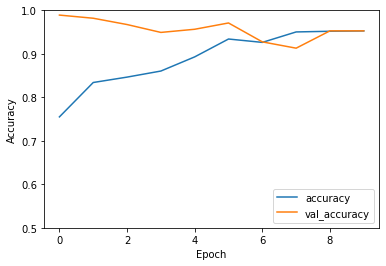

In [143]:
#Promising but looks like it needs more training

plt.plot(history.history['accuracy'], label='accuracy')
plt.plot(history.history['val_accuracy'], label = 'val_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.ylim([0.5, 1])
plt.legend(loc='lower right')

test_loss, test_acc = model.evaluate(test_dataset, verbose=2)

At this point we needed to run things longer (a few hours) than you could do in a notebook. I also added image augmentation. The script in which we did that is large-redmapper-with-aug.py in this github. The results were save and loaded below.

# Many Epochs with Data Aug

This is what's loaded in the pretrained model below. You can try to run it here but it generally takes >1h so rude to do on an interactive node

In [2]:
pos_im_act = []
path = '/gpfs/fs0/project/r/rbond/jorlo/datasets/ml-clusters/'
#for directory in os.listdir(path+'act/'):
#    print(directory)
#    h5f = h5py.File(path+'act/'+directory)
#    pos_im_act.append(h5f['act'][:])
    
#pos_im_act = np.vstack(pos_im_act)
    
pos_im_des = []
path = '/gpfs/fs0/project/r/rbond/jorlo/datasets/ml-clusters/'
for directory in os.listdir(path+'des/'):
    print(directory)
    h5f = h5py.File(path+'des/'+directory)
    pos_im_des.append(h5f['des'][:])
    
pos_im_des = np.vstack(pos_im_des)

neg_im = []
path = '/gpfs/fs0/project/r/rbond/jorlo/datasets/ml-clusters/'
for directory in os.listdir(path+'random/'):
    print(directory)
    h5f = h5py.File(path+'random/'+directory)
    neg_im.append(h5f['random'][:])
    
neg_im = np.vstack(neg_im)

#pos_im = pos_im_act
pos_im = pos_im_des
#pos_im = np.concatenate((pos_im_act, pos_im_des))


des_0_w_y.h5
des_5000_w_y.h5
des_2000_w_y.h5
des_1000_w_y.h5
des_6000_w_y.h5
des_4000_w_y.h5
des_3000_w_y.h5
random_2000_w_y.h5
random_6000_w_y.h5
random_7000_w_y.h5
random_5000_w_y.h5
random_4000_w_y.h5
random_3000_w_y.h5
random_1000_w_y.h5
random_0_w_y.h5


In [5]:
#pos_im = pos_im_des
neg_im.shape

(7866, 399, 399, 6)

In [6]:
flags = []
for i in range(pos_im.shape[0]):
        if np.any(np.isnan(pos_im[i,...])):
                flags.append(i)

pos_im = np.delete(pos_im, flags, axis = 0)

flags = []
for i in range(neg_im.shape[0]):
        if np.any(np.isnan(neg_im[i,...])):
                flags.append(i)

neg_im = np.delete(neg_im, flags, axis = 0)


neg_im = neg_im[:len(pos_im)]
pos_im = pos_im[:len(neg_im)]

neg_im = neg_im[:3000]
pos_im = pos_im[:3000]
print(len(pos_im), len(neg_im))


3000 3000


In [7]:
w_y = 'False'

if w_y == 'False':
        print('No y')
        pos_im, neg_im = pos_im[...,:5], neg_im[...,:5]

tot = min(pos_im.shape[0], neg_im.shape[0])
train_size = int(0.7 * tot)
val_size = int(0.15 * tot)
test_size = int(0.15 * tot)

train_pos = pos_im[:train_size]
val_pos = pos_im[train_size:train_size + val_size]
test_pos = pos_im[train_size + val_size:]

train_neg = neg_im[:train_size]
val_neg = neg_im[train_size:train_size + val_size]
test_neg = neg_im[train_size + val_size:]

input_shape = train_pos.shape[1:]

train_images = np.concatenate((train_pos,train_neg))
val_images = np.concatenate((val_pos,val_neg))
test_images = np.concatenate((test_pos,test_neg))

train_labels = np.array(train_pos.shape[0]*[1] + train_neg.shape[0]*[0])
val_labels = np.array(val_pos.shape[0]*[1] + val_neg.shape[0]*[0])
test_labels = np.array(test_pos.shape[0]*[1] + test_neg.shape[0]*[0])

batch_size = 10

train_dataset = tf.data.Dataset.from_tensor_slices((train_images, train_labels))
val_dataset = tf.data.Dataset.from_tensor_slices((val_images, val_labels))
test_dataset = tf.data.Dataset.from_tensor_slices((test_images, test_labels))

train_dataset = train_dataset.shuffle(buffer_size=1024).batch(batch_size)
val_dataset = val_dataset.shuffle(buffer_size=1024).batch(batch_size)
test_dataset = test_dataset.shuffle(buffer_size=1024).batch(batch_size)

model = make_model('kosiba', input_shape = input_shape, degree = 4)


No y
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 397, 397, 64)      2944      
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 198, 198, 64)      0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 196, 196, 32)      18464     
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 98, 98, 32)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 96, 96, 32)        9248      
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 48, 48, 32)        0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 46, 46, 32)    

In [8]:
data_augmentation = tf.keras.preprocessing.image.ImageDataGenerator(rotation_range=360, width_shift_range=4,
    height_shift_range=4,zoom_range=0.3)


In [ ]:
history = model.fit(data_augmentation.flow(train_images, train_labels), epochs=int(20),
                    validation_data=val_dataset)


/home/r/rbond/jorlo/.conda/envs/gpu-ml-clusters/lib/python3.7/site-packages/keras_preprocessing/image/numpy_array_iterator.py:127: UserWarning: NumpyArrayIterator is set to use the data format convention "channels_last" (channels on axis 3), i.e. expected either 1, 3, or 4 channels on axis 3. However, it was passed an array with shape (4200, 399, 399, 5) (5 channels).
  str(self.x.shape[channels_axis]) + ' channels).')


  ...
    to  
  ['...']
Train for 132 steps, validate for 90 steps
Epoch 1/20
132/132 [==============================] - 227s 2s/step - loss: 2.3705 - accuracy: 0.4969 - val_loss: 2.3034 - val_accuracy: 0.5122
Epoch 2/20
132/132 [==============================] - 223s 2s/step - loss: 2.2489 - accuracy: 0.5138 - val_loss: 2.1972 - val_accuracy: 0.5044
Epoch 3/20
132/132 [==============================] - 220s 2s/step - loss: 2.1466 - accuracy: 0.5148 - val_loss: 2.1001 - val_accuracy: 0.5056
Epoch 4/20
132/132 [==============================] - 221s 2s/step - loss: 2.0405 - accuracy: 0.5531 - val_loss: 1.9996 - val_accuracy: 0.5678
Epoch 5/20
132/132 [==============================] - 218s 2s/step - loss: 1.8313 - accuracy: 0.7057 - val_loss: 1.6408 - val_accuracy: 0.8344
Epoch 6/20
132/132 [==============================] - 220s 2s/step - loss: 1.4307 - accuracy: 0.8979 - val_loss: 1.2409 - val_accuracy: 0.9689
Epoch 7/20
132/132 [==============================] - 223s 2s/step - loss:

30/30 - 1s - loss: 1.1271 - accuracy: 0.9865


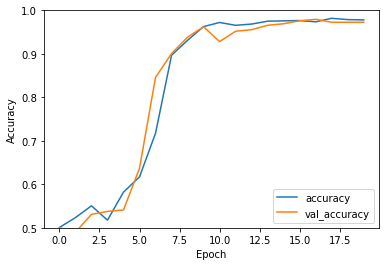

In [10]:

plt.plot(history.history['accuracy'], label='accuracy')
plt.plot(history.history['val_accuracy'], label = 'val_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.ylim([0.5, 1])
plt.legend(loc='lower right')

test_loss, test_acc = model.evaluate(test_dataset, verbose=2)

# Pretrained Redmapper

In [61]:
#pos_im = pk.load(open('/gpfs/fs0/project/r/rbond/jorlo/datasets/cluster-test/large-redmapper/large-redmapper_w_y.pk', 'rb'))
#pos_im = pk.load(open('/gpfs/fs0/project/r/rbond/jorlo/datasets/cluster-test/large-act/large-act_w_y.pk', 'rb'))
#neg_im = pk.load(open('/gpfs/fs0/project/r/rbond/jorlo/datasets/cluster-test/large-randoms/large-randoms_w_y.pk', 'rb'))


h5f_des = h5py.File('/gpfs/fs0/project/r/rbond/jorlo/datasets/ml-clusters/des/full_des_1000_w_y.h5','r')
h5f_random = h5py.File('/gpfs/fs0/project/r/rbond/jorlo/datasets/ml-clusters/random/full_random_1000_w_y.h5','r')
h5f_act = h5py.File('/gpfs/fs0/project/r/rbond/jorlo/datasets/ml-clusters/act/full_act_1000_w_y.h5','r')


pos_im_1 = h5f_des['des'][:]
neg_im = h5f_random['random'][:]
pos_im_2 = h5f_act['act'][:]

pos_im = np.concatenate((pos_im_1, pos_im_2))


flags = []
for i in range(pos_im.shape[0]):
    if np.any(np.isnan(pos_im[i,...])):
        flags.append(i)

pos_im = np.delete(pos_im, flags, axis = 0)        

flags = []
for i in range(neg_im.shape[0]):
    if np.any(np.isnan(neg_im[i,...])):
        flags.append(i)

neg_im = np.delete(neg_im, flags, axis = 0)   


neg_im = neg_im[:len(pos_im)]
pos_im = pos_im[:len(neg_im)]

print(len(pos_im), len(neg_im))

pos_im, neg_im = pos_im[...,:5], neg_im[...,:5]

red_pos = h5f_des['des'][:]
red_neg = h5f_random['random'][:]

flags = []
for i in range(red_pos.shape[0]):
    if np.any(np.isnan(red_pos[i,...])):
        flags.append(i)

red_pos = np.delete(red_pos, flags, axis = 0)        

flags = []
for i in range(red_neg.shape[0]):
    if np.any(np.isnan(red_neg[i,...])):
        flags.append(i)

red_neg = np.delete(red_neg, flags, axis = 0)   


red_neg = red_neg[:len(red_pos)]
red_pos = red_pos[:len(red_neg)]

print(len(red_pos), len(red_neg))

red_pos, red_neg = red_pos[...,:5], red_neg[...,:5]

922 922
351 351


In [62]:
tot = min(pos_im.shape[0], neg_im.shape[0])
train_size = int(0.7 * tot)
val_size = int(0.15 * tot)
test_size = int(0.15 * tot)
    
train_pos = pos_im[:train_size]
val_pos = pos_im[train_size:train_size + val_size]
test_pos = pos_im[train_size + val_size:]
    
train_neg = neg_im[:train_size]
val_neg = neg_im[train_size:train_size + val_size]
test_neg = neg_im[train_size + val_size:]

input_shape = train_pos.shape[1:]

red_tot = tot = min(red_pos.shape[0], neg_red.shape[0])

red_train_size = int(0.7 * red_tot)
red_val_size = int(0.15 * red_tot)
red_test_size = int(0.15 * red_tot)

red_test_pos = red_pos[red_train_size + red_val_size:]
red_test_neg = red_neg[red_train_size + red_val_size:]


In [63]:
red_tot

351

In [64]:
train_images = np.concatenate((train_pos,train_neg))
val_images = np.concatenate((val_pos,val_neg))
test_images = np.concatenate((test_pos,test_neg))
red_test_images = np.concatenate((red_test_pos, red_test_neg))

train_labels = np.array(train_pos.shape[0]*[1] + train_neg.shape[0]*[0])
val_labels = np.array(val_pos.shape[0]*[1] + val_neg.shape[0]*[0])
test_labels = np.array(test_pos.shape[0]*[1] + test_neg.shape[0]*[0])
red_test_labels = np.array(red_test_pos.shape[0]*[1] + red_test_neg.shape[0]*[0])

In [65]:
model = make_model('kosiba', input_shape = input_shape, degree = 4)

Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_20 (Conv2D)           (None, 397, 397, 64)      2944      
_________________________________________________________________
max_pooling2d_20 (MaxPooling (None, 198, 198, 64)      0         
_________________________________________________________________
conv2d_21 (Conv2D)           (None, 196, 196, 32)      18464     
_________________________________________________________________
max_pooling2d_21 (MaxPooling (None, 98, 98, 32)        0         
_________________________________________________________________
conv2d_22 (Conv2D)           (None, 96, 96, 32)        9248      
_________________________________________________________________
max_pooling2d_22 (MaxPooling (None, 48, 48, 32)        0         
_________________________________________________________________
conv2d_23 (Conv2D)           (None, 46, 46, 32)       

In [66]:
#This model was trained only on redmapper clusters
checkpoint_path = "/scratch/r/rbond/jorlo/ml-clusters/models/redmapper_wo_y.ckpt"
model.load_weights(checkpoint_path)

In [67]:
#The accuracy sadly isn't that much better than above but 81% is getting somewhere
loss, acc = model.evaluate(test_images, test_labels, verbose=2)
loss, acc = model.evaluate(red_test_images, red_test_labels, verbose=2)


278/278 - 1s - loss: 2.7835 - accuracy: 0.8129
108/108 - 0s - loss: 1.8242 - accuracy: 0.9444


In [53]:
#Do we do better including the y?
checkpoint_path = "/scratch/r/rbond/jorlo/ml-clusters/models/redmapper_w_y.ckpt"
model.load_weights(checkpoint_path)

loss, acc = model.evaluate(test_images, test_labels, verbose=2)
loss, acc = model.evaluate(red_test_images, red_test_labels, verbose=2)


278/278 - 1s - loss: 3.2902 - accuracy: 0.8453
388/388 - 1s - loss: 8.2477 - accuracy: 0.5954


In [ ]:
for thing in test_dataset:
    for i in range(thing[1].shape[0]):
        truth = thing[1][i]
        imap = thing[0][i]
        pred = model.predict(np.expand_dims(thing[0][i], axis = 0))
        print(truth.numpy(), np.argmax(tf.nn.softmax(pred)[0]), 100*np.max(tf.nn.softmax(pred)[0]))
        plt.imshow(imap[...,5])
        plt.show()
        plt.close()
        plt.imshow(np.log(np.abs(imap[...,2])))
        plt.show()
        plt.close()

There was concern that the model was only using the SZ info and nothing from the optical, so I manually set the SZ weights to zero

In [83]:

for layer in model.layers:
    if layer.name[0:6] == 'conv2d':
        temp = layer.get_weights()
        temp[0][...,:5,:] = np.zeros(temp[0][...,:5,:].shape)
        layer.set_weights(temp)

In [84]:

loss, acc_test = model.evaluate(test_images, test_labels, verbose=2)
loss, acc_val = model.evaluate(val_images, val_labels, verbose=2)
loss, acc_train = model.evaluate(train_images, train_labels, verbose=2)


69/69 - 0s - loss: 4.0786 - accuracy: 0.4638
28/28 - 0s - loss: 3.0478 - accuracy: 0.6429
138/138 - 0s - loss: 2.9386 - accuracy: 0.6304


SZ is definitely driving the accuracy here but it does seem like optical is doing something? At this point we needed a larger data set, so I got to making images of all the clusters, which is what's going on in full_stamper.py. We now have about 6000 clusters and as many negatives to train on, but I just haven't had the time to actually run it yet, which is basically where the project stands

In [28]:
act_bad.shape

(807, 399, 399, 6)

In [29]:
act_good.shape

(103, 399, 399, 6)

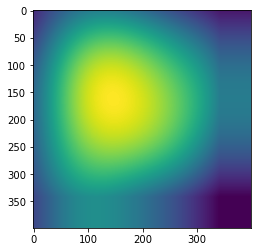

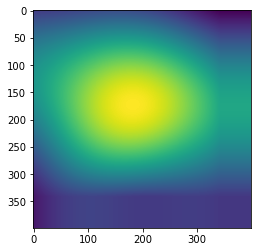

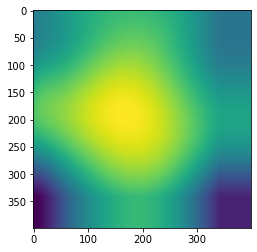

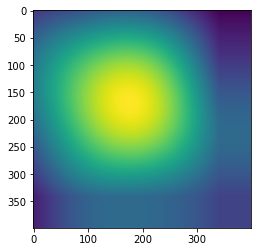

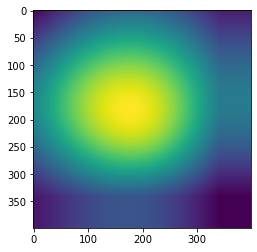

...

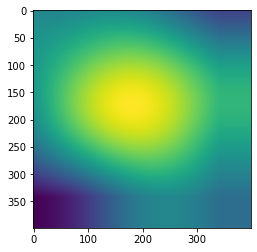

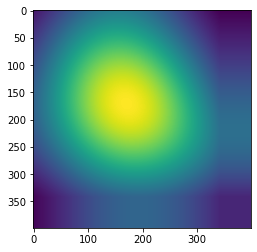

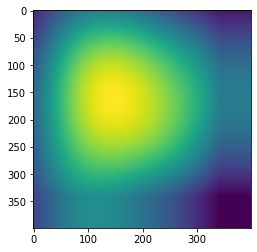

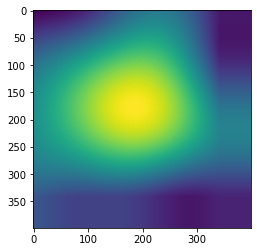

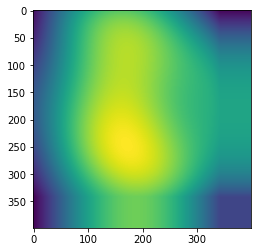

In [58]:
for i in range(act_good.shape[0]):
    plt.imshow(act_good[i,...,5])
    plt.show()
    plt.close()
    plt.imshow(act[i,...,5])
    plt.show()
    plt.close()


# Testing Region Proposal

In [11]:
import cv2

def selective_search(image, method=None):

    ss = cv2.ximgproc.segmentation.createSelectiveSearchSegmentation()
    ss.setBaseImage(image)
    # check to see if we are using the *fast* but *less accurate* version
    # of selective search
    if method == "fast":
        ss.switchToSelectiveSearchFast()
    # otherwise we are using the *slower* but *more accurate* version
    else:
        ss.switchToSelectiveSearchQuality()
    # run selective search on the input image
    rects = ss.process()
    # return the region proposal bounding boxes
    return rects

In [13]:
im = pos_im[5,...,2:]

rects = selective_search(im.astype('float32'))

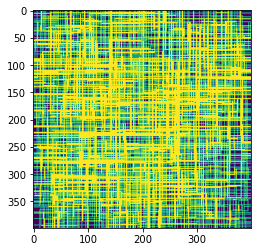

In [14]:
imOut = im.copy()
for i, rect in (enumerate(rects)):
    x, y, w, h = rect
#     print(x,y,w,h)
#     imOut = imOut[x:x+w,y:y+h]
    cv2.rectangle(imOut, (x, y), (x+w, y+h), (0, 255, 0), 1, cv2.LINE_AA)
# plt.figure()
plt.imshow(imOut[...,1])


In [8]:
des_catalog = fits.open('/home/r/rbond/jorlo/dev/ML-clusters/data/des/redmapper_y1a1_public_v6.4_catalog.fits')
ras, decs = des_catalog[1].data['RA'], des_catalog[1].data['dec']

... WCS set-up took 63.056 sec ...


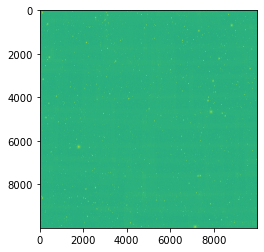

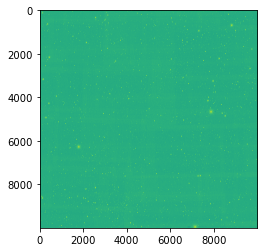

/home/r/rbond/jorlo/.conda/envs/gpu-ml-clusters/lib/python3.7/site-packages/ipykernel_launcher.py:15: RuntimeWarning: divide by zero encountered in log
  from ipykernel import kernelapp as app


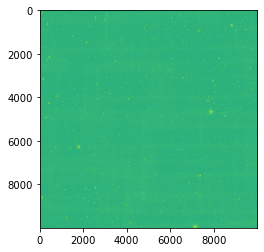

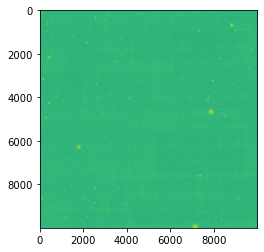

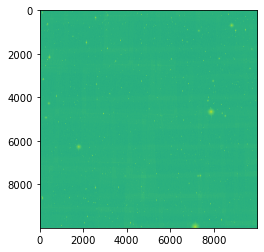

In [57]:
tiler=DESTiler.DESTiler("DES_DR1_TILE_INFO.csv")

names = os.listdir('/project/r/rbond/jorlo/datasets/DESTileImages/')
to_return = []
ra, dec= ras[0], decs[0]

tileName=tiler.getTileName(ra, dec)
for name in names:
    if tileName in name:
        fileName = name[:21]
        break
bands = ['g', 'r', 'i', 'z', 'Y']
for j, band in enumerate(bands):
    hi_data = fits.open('/project/r/rbond/jorlo/datasets/DESTileImages/{}_{}.fits.fz'.format(fileName,band))
    plt.imshow(np.log(np.abs(hi_data[1].data)))
    plt.show()
    plt.close()


In [58]:
header = hi_data[1].header
w = wcs.WCS(header)
hdata = hi_data[1].data


In [59]:
hdata.shape

(10000, 10000)

In [67]:
print(wcs.utils.pixel_to_skycoord(0,0, w))
print(wcs.utils.pixel_to_skycoord(10000,10000, w))

dec,ra = np.deg2rad([wcs.utils.pixel_to_skycoord(5000,5000, w).dec.value,wcs.utils.pixel_to_skycoord(5000,5000, w).ra.value]) 
width = np.deg2rad(np.abs(wcs.utils.pixel_to_skycoord(10000,10000, w).dec.value - wcs.utils.pixel_to_skycoord(0,0, w).dec.value))
box = [[dec-width/2.,ra-width/2.],[dec+width/2.,ra+width/2.]]


smap = enmap.read_fits('/gpfs/fs0/project/r/rbond/jorlo/SZ_map/stitched_Arnaud_M2e14_z0p4_filteredMap.fits', box = box)


AttributeError: 'numpy.int32' object has no attribute 'cpdis1'

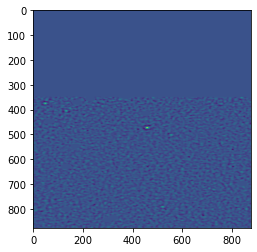

In [63]:
plt.imshow(smap)

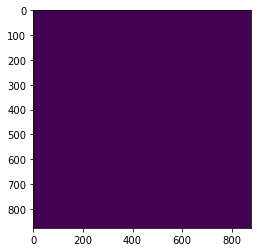

In [64]:
im = np.stack((smap,smap,smap), axis = -1)

rects = selective_search(im.astype('float32'))
imOut = im.copy()
for i, rect in (enumerate(rects)):
    x, y, w, h = rect
#     print(x,y,w,h)
#     imOut = imOut[x:x+w,y:y+h]
    cv2.rectangle(imOut, (x, y), (x+w, y+h), (0, 255, 0), 1, cv2.LINE_AA)
# plt.figure()
plt.imshow(imOut[...,1])


In [66]:
rects

array([[  0,   0, 877, 877]], dtype=int32)

In [43]:
model = make_model()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_8 (Conv2D)            (None, 340, 340, 32)      1472      
_________________________________________________________________
max_pooling2d_7 (MaxPooling2 (None, 170, 170, 32)      0         
_________________________________________________________________
conv2d_9 (Conv2D)            (None, 168, 168, 64)      18496     
_________________________________________________________________
max_pooling2d_8 (MaxPooling2 (None, 84, 84, 64)        0         
_________________________________________________________________
conv2d_10 (Conv2D)           (None, 82, 82, 64)        36928     
_________________________________________________________________
flatten_2 (Flatten)          (None, 430336)            0         
_________________________________________________________________
dense_4 (Dense)              (None, 64)               